# Distanciamiento social
Por: Gabriel Missael Barco

En diversos estudios se concluye que el distanciamiento social ayuda a frenar el avance rapido de una epidemia; estas conclusiones son obtenidas principalmente mediante simulaciones y realizando diversas suposiciones sobre la estructura social y el comportamiento de los individuos, particularmente con aquellas cosas que tengan que ver con el contacto directo con otras personas. Veanse, por ejemplo, estos dos muy buenos articulos: 

1. [Spontaneous social distancing in response
to a simulated epidemic: a virtual experiment](https://bmcpublichealth.biomedcentral.com/track/pdf/10.1186/s12889-015-2336-7)
2. [Targeted Social Distancing Designs for Pandemic Influenza](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3372334/)



In [239]:
#Utilizaremos estas librerias.

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
import random
from IPython.display import HTML

En este notebook realizamos una simulacion ilustrativa de la expansión de una pandemia con y sin distanciamiento social, y otra con congeturas muy generales sobre la población de, en este caso, la ciudad de León, Guanajuato, México. Notese que, a pesar de que he tratado de tomar paramtros reales sobre la población y el coronavirus, esto es meramente un experimento y **no debe ser tomado como un analisis serio** (por ejemplo, ninguna de las variables declaradas a continuación son valores dados, si no que tienen una función de probabilidad que no es tomada en cuenta aqui).

In [240]:
#VARIABLES GLOBALES
#probabilidad de transmisión dado que una persona sana tiene contacto con una persona portadora
#(es alta ya que el SARS-CoV-2 es altamente contagioso)
p_transmision = 0.5

#dias de incubación
t_asintomatico = 12

#dias de recuperación
t_rec = 14

#probabilidad de muerte
p_muerte = 0.02

#Una persona puede tener esto cuatro estados durante la epidemia
estado = {
    "sano":'#3252a8',
    "asintomatico":'orange',
    "enfermo":'red',
    "muerto":'black',
    "inmune":'green'
}

In [260]:
def genera_poblacion(n_personas, porcentaje, x_lim, y_lim):
    '''
    DESCRIPTION: Esta función genera una muestra de n personas
                 donde cierto porcentaje cumple el distanciamiento social
    IN: n_personas = tamaño de la poblacion
        porcentaje = numero de personas 
    '''
    poblacion = []
    aislados = int(n_personas/100*porcentaje)
    
    #Generamos aleatoriamente la posición y la direccion de la velocidad (rapidez = 1)
    for i in range(n_personas):
        poblacion.append([estado['sano'], 0, random.uniform(0, x_lim),
                          random.uniform(0, y_lim), random.uniform(-1,1)])
        if random.uniform(-1,1)>0:
            poblacion[i].append((1-poblacion[i][4]**2)**(1/2))
        else:
            poblacion[i].append(-(1-poblacion[i][4]**2)**(1/2))
        if i<aislados:
            poblacion[i].append(True)
        else:
            poblacion[i].append(False)      
    return poblacion

def toca(poblacion, radio):
    '''
    Regresa matriz booleana de cuales puntos se estan tocando
    '''
    tocando = np.zeros((len(poblacion), len(poblacion)))
    tocando_item = np.zeros(len(poblacion))
    for i, persona in enumerate(poblacion):
        for j in range(i-1):
            distancia = ((persona[2]-poblacion[j][2])**2+(persona[3]-poblacion[j][3])**2)**(1/2)
            if distancia <= radio:
                tocando[i][j] = 1
                tocando[j][i] = 1
                tocando_item[i] = 1
                tocando_item[j] = 1
    return tocando_item, tocando

def en_borde(punto):
    if 0 > punto[2]:
        return 1
    elif punto[2] > x_lim:
        return 2
    elif 0 > punto[3]:
        return 3
    elif punto[3] > y_lim:
        return 4
    else:
        return 0
    
def contagia():
    if (random.uniform(0,1) <= p_transmision):
        return True
    else: 
        return False
    
def cambia_velocidad(item, tocando):
    
    for i, persona in enumerate(poblacion):
        if item[i]:
            for j in range(i-1):
                if tocando[i][j]:
                    aux = poblacion[i][4]
                    poblacion[i][4] = poblacion[j][4]
                    poblacion[j][4] = aux
                    aux = poblacion[i][5]
                    poblacion[i][5] = poblacion[j][5]
                    poblacion[j][5] = aux
        borde = en_borde(persona)
        if borde:
            if borde == 1 or borde == 2:
                poblacion[i][4] *=-1
            else:
                poblacion[i][5]*=-1
                

def cambia_posicion(paso):
    for i in range(len(poblacion)):
        poblacion[i][2] += poblacion[i][4]*paso 
        poblacion[i][3] += poblacion[i][5]*paso

def puntos(lista):
    return [[objeto[2] for objeto in lista],[objeto[3] for objeto in lista]]

In [263]:
radio = 0.026
y_lim = 1
x_lim = 2*y_lim
paso = 0.005

poblacion = genera_poblacion(80, 10, x_lim, y_lim)
poblacion[0][0] = estado['asintomatico']

fig = plt.figure(figsize = (8,4))
ax = plt.axes(xlim=(0, x_lim), ylim=(0, y_lim))


x = [persona[2] for persona in poblacion]
y = [persona[3] for persona in poblacion]
color = [persona[0] for persona in poblacion]
puntos = ax.scatter(x, y, c = color)

plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().axes.get_xaxis().set_visible(False)

def animacion(i):
    item, tocando = toca(poblacion, radio)
    
    cambia_velocidad(item, tocando)
    cambia_posicion(paso)
    
    x = [persona[2] for persona in poblacion]
    y = [persona[3] for persona in poblacion]
    
    puntos.set_offsets(np.c_[x, y])
    
    return puntos
    
anim = animation.FuncAnimation(fig, animacion, frames=500, interval=20)
plt.close(anim._fig)

In [264]:
HTML(anim.to_jshtml())

In [24]:
#anim.save('intento1.mp4')

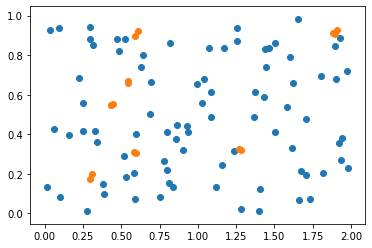

In [265]:
poblacion = genera_poblacion(100, 10, x_lim, y_lim)
item, tocando = toca(poblacion, 0.029)

x1, y1, x2, y2 = [], [], [], []
for i, persona in enumerate(poblacion):
    if item[i]:
        x2.append(persona[2])
        y2.append(persona[3])
    else:
        x1.append(persona[2])
        y1.append(persona[3])

plt.scatter(x1, y1)
plt.scatter(x2, y2)